# Deep Dream

[link text](https://)## Importing the libraries

- Adapted from: https://www.tensorflow.org/beta/tutorials/generative/deepdream

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
tf.__version__

'2.15.0'

## Loading the pre-built convolutional neural network

- InceptionNet: https://www.tensorflow.org/api_docs/python/tf/keras/applications/inception_v3
- Original paper: https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Szegedy_Rethinking_the_Inception_CVPR_2016_paper.pdf
- Imagenet: http://www.image-net.org/

In [2]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

87910968/87910968 [==============================] - 5s 0us/step


In [3]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, None, None, 32)       0         ['batch_normalizati

In [4]:
len(base_model.layers)

311

In [5]:
# Relu
#names = ['mixed3', 'mixed5', 'mixed8', 'mixed9']
names = ['mixed3', 'mixed5']

In [6]:
base_model.input

<KerasTensor: shape=(None, None, None, 3) dtype=float32 (created by layer 'input_1')>

In [7]:
layers = [base_model.get_layer(name).output for name in names]

In [8]:
layers

[<KerasTensor: shape=(None, None, None, 768) dtype=float32 (created by layer 'mixed3')>,
 <KerasTensor: shape=(None, None, None, 768) dtype=float32 (created by layer 'mixed5')>]

In [9]:
deep_dream_model = tf.keras.Model(inputs = base_model.input, outputs = layers)

## Loading and pre-processing the image

In [13]:
image = tf.keras.preprocessing.image.load_img('/content/IMG_3209.jpg',
                                              target_size=(225, 375))

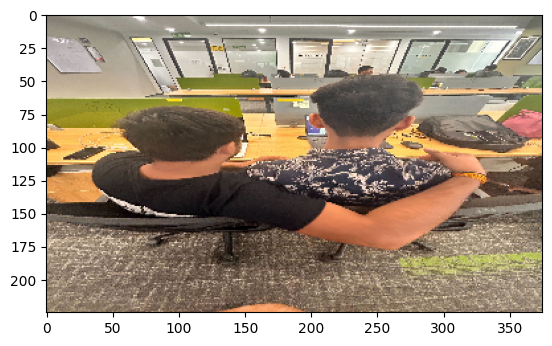

In [14]:
plt.imshow(image);

In [15]:
type(image)

PIL.Image.Image

In [16]:
image.size

(375, 225)

In [17]:
image.mode, len(image.mode)

('RGB', 3)

In [18]:
list(image.getdata())

[(136, 130, 118),
 (131, 125, 113),
 (144, 138, 126),
 (144, 138, 126),
 (140, 134, 122),
 (146, 140, 128),
 (145, 139, 127),
 (143, 137, 125),
 (148, 142, 130),
 (155, 149, 137),
 (153, 146, 136),
 (153, 146, 136),
 (154, 145, 138),
 (152, 148, 139),
 (151, 149, 137),
 (152, 150, 138),
 (151, 148, 141),
 (150, 147, 140),
 (153, 151, 139),
 (156, 154, 142),
 (154, 152, 140),
 (154, 152, 140),
 (161, 159, 147),
 (157, 155, 143),
 (158, 156, 144),
 (157, 155, 143),
 (157, 155, 143),
 (160, 158, 146),
 (161, 159, 147),
 (161, 159, 147),
 (161, 159, 147),
 (160, 158, 146),
 (158, 156, 144),
 (160, 158, 146),
 (159, 157, 145),
 (162, 160, 148),
 (159, 157, 145),
 (159, 157, 145),
 (158, 156, 144),
 (158, 156, 144),
 (158, 156, 144),
 (158, 156, 144),
 (158, 156, 144),
 (155, 153, 141),
 (159, 157, 145),
 (157, 155, 143),
 (158, 156, 144),
 (159, 157, 145),
 (157, 155, 143),
 (157, 155, 143),
 (157, 155, 143),
 (158, 156, 144),
 (161, 159, 147),
 (160, 158, 146),
 (164, 162, 150),
 (168, 166

In [19]:
image = tf.keras.preprocessing.image.img_to_array(image)

In [20]:
type(image)

numpy.ndarray

In [21]:
image.shape

(225, 375, 3)

In [22]:
image.min(), image.max()

(0.0, 255.0)

In [23]:
# image = image / 255
image = tf.keras.applications.inception_v3.preprocess_input(image)

In [24]:
image.min(), image.max()

(-1.0, 1.0)

## Getting the activations

In [25]:
image.shape

(225, 375, 3)

In [27]:
image_batch = tf.expand_dims(image, axis = 0)

In [28]:
image_batch.shape

TensorShape([1, 225, 375, 3])

In [29]:
activations = deep_dream_model.predict(image_batch)

1/1 [==============================] - 3s 3s/step


In [30]:
deep_dream_model.outputs

[<KerasTensor: shape=(None, None, None, 768) dtype=float32 (created by layer 'mixed3')>,
 <KerasTensor: shape=(None, None, None, 768) dtype=float32 (created by layer 'mixed5')>]

In [31]:
len(activations)

2

In [32]:
activations[1]

array([[[[0.        , 1.5260048 , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 1.1815943 , 0.        , ..., 0.        ,
          0.2976329 , 0.        ],
         [0.        , 0.34608942, 0.        , ..., 0.        ,
          0.5971672 , 0.17632407],
         ...,
         [0.        , 0.04103565, 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.11100826, ..., 0.        ,
          0.        , 0.        ]],

        [[0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.38207862, 0.        ],
         [0.08342085, 0.        , 0.        , ..., 0.        ,
          0.8195826 , 0.09779464],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0. 

In [33]:
activations[0].shape, activations[1].shape

((1, 12, 21, 768), (1, 12, 21, 768))

## Calculating the loss

In [34]:
def calculate_loss(image, network):
  image_batch = tf.expand_dims(image, axis = 0)
  activations = network(image_batch)

  losses = []
  for act in activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  #print(losses)
  #print(np.shape(losses))
  #print(tf.reduce_sum(losses))

  return tf.reduce_sum(losses)

In [35]:
0.45195404 + 0.16485049

0.61680453

In [36]:
loss = calculate_loss(image, deep_dream_model)
loss

<tf.Tensor: shape=(), dtype=float32, numpy=0.7331002>

## Gradient ascent

In [37]:
# Compare the activations with the pixels
# Emphasize parts of the image
# Change the pixels of the input image

@tf.function
def deep_dream(network, image, learning_rate):
  with tf.GradientTape() as tape:
    tape.watch(image)
    loss = calculate_loss(image, network)

  gradients = tape.gradient(loss, image) # Derivate
  gradients /= tf.math.reduce_std(gradients)
  image = image + gradients * learning_rate
  image = tf.clip_by_value(image, -1, 1)

  return loss, image

In [38]:
def inverse_transform(image):
  image = 255 * (image + 1.0) / 2.0
  return tf.cast(image, tf.uint8)

In [39]:
def run_deep_dream(network, image, epochs, learning_rate):
  for epoch in range(epochs):
    loss, image = deep_dream(network, image, learning_rate)

    if epoch % 200 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(inverse_transform(image))
      plt.show()
      print('Epoch {}, loss {}'.format(epoch, loss))

## Generating images

In [40]:
image.shape, type(image)

((225, 375, 3), numpy.ndarray)

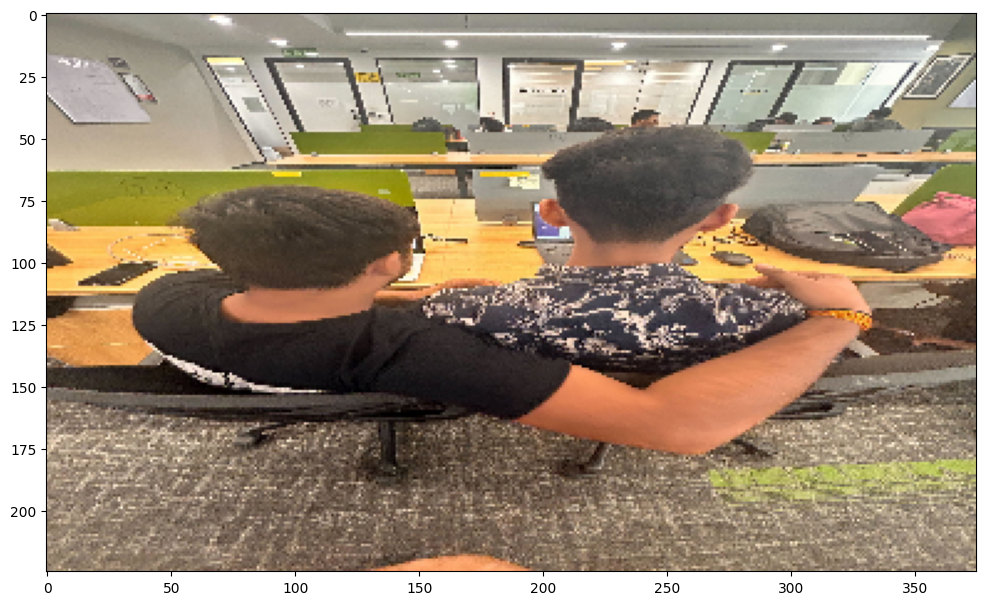

Epoch 0, loss 0.7331001162528992


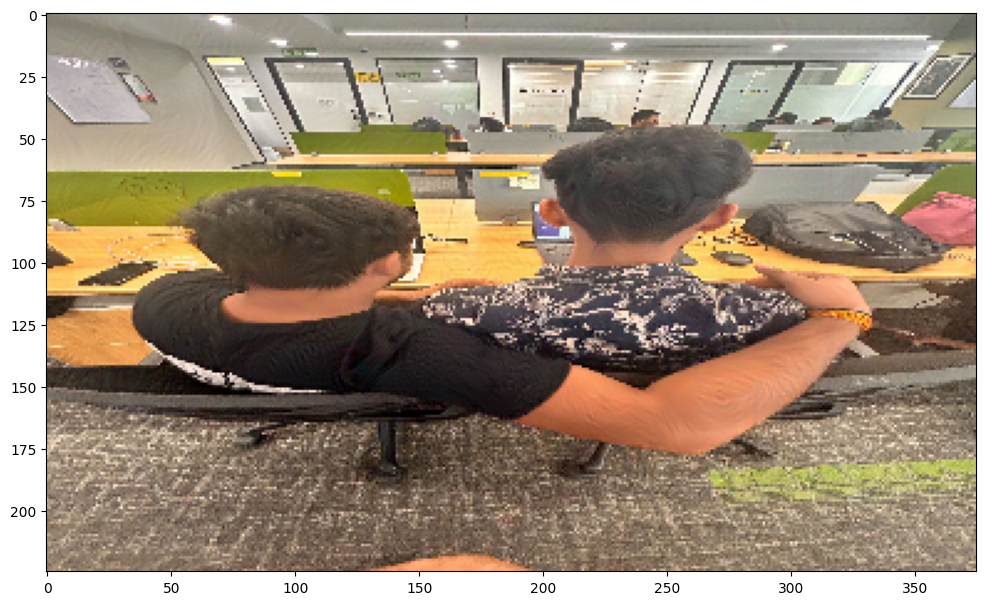

Epoch 200, loss 1.0095146894454956


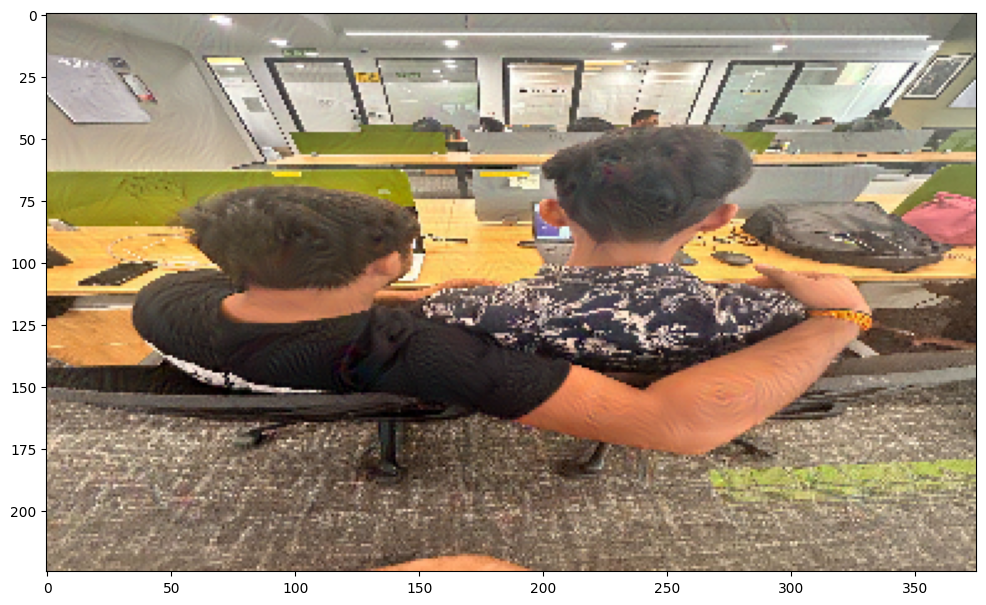

Epoch 400, loss 1.1752952337265015


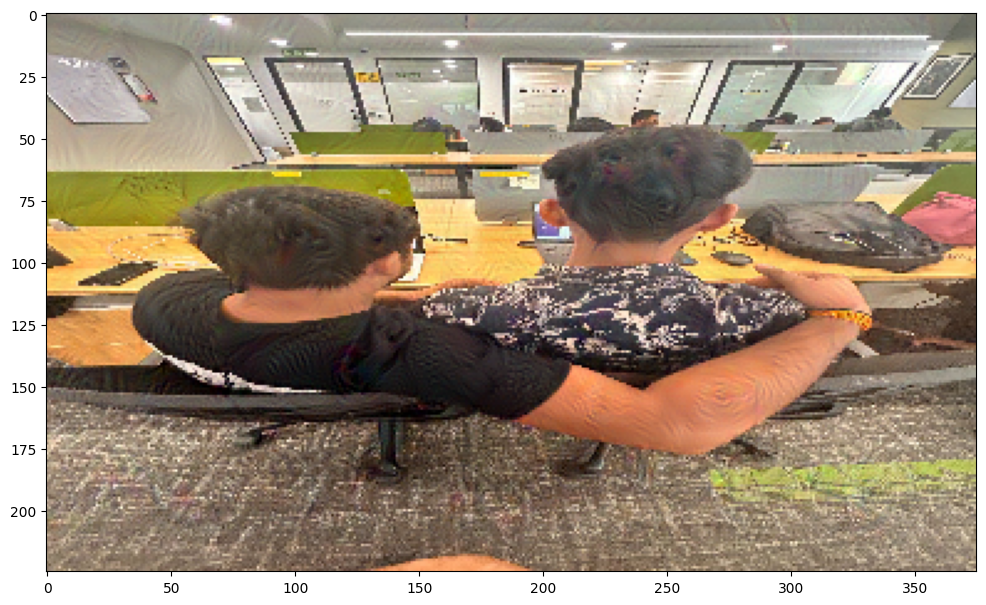

Epoch 600, loss 1.2971807718276978


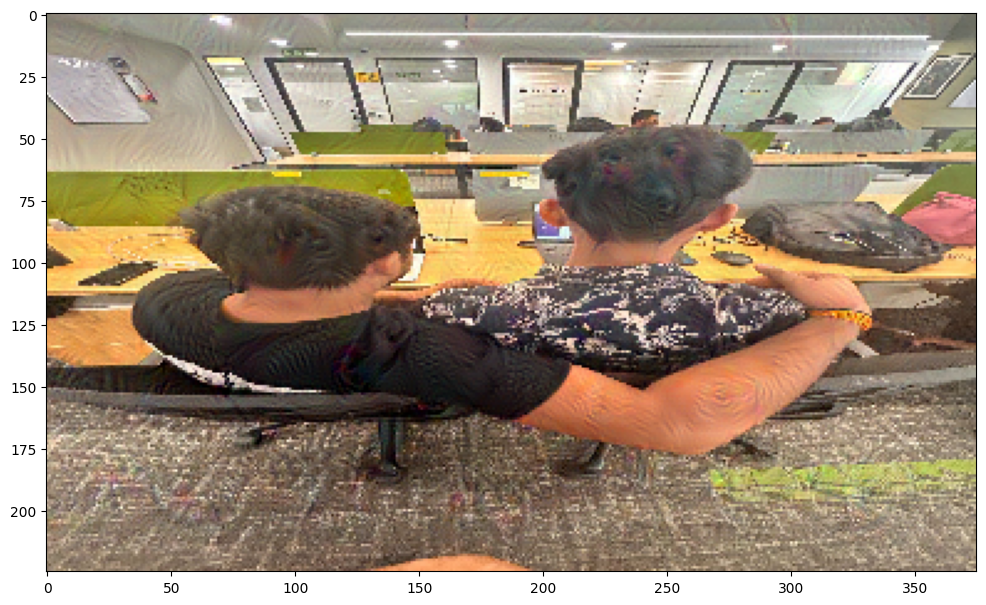

Epoch 800, loss 1.3913127183914185


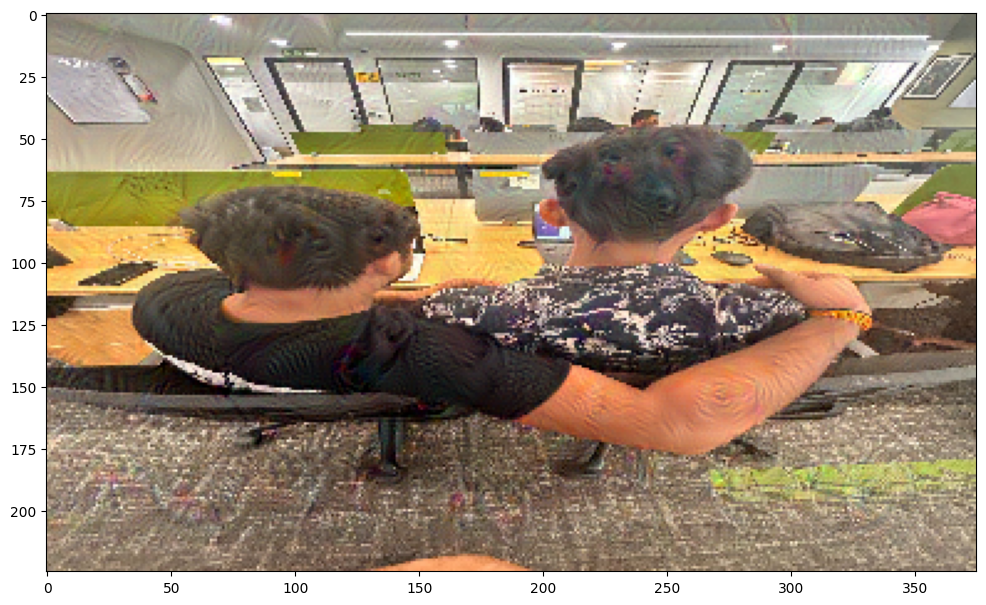

Epoch 1000, loss 1.4679040908813477


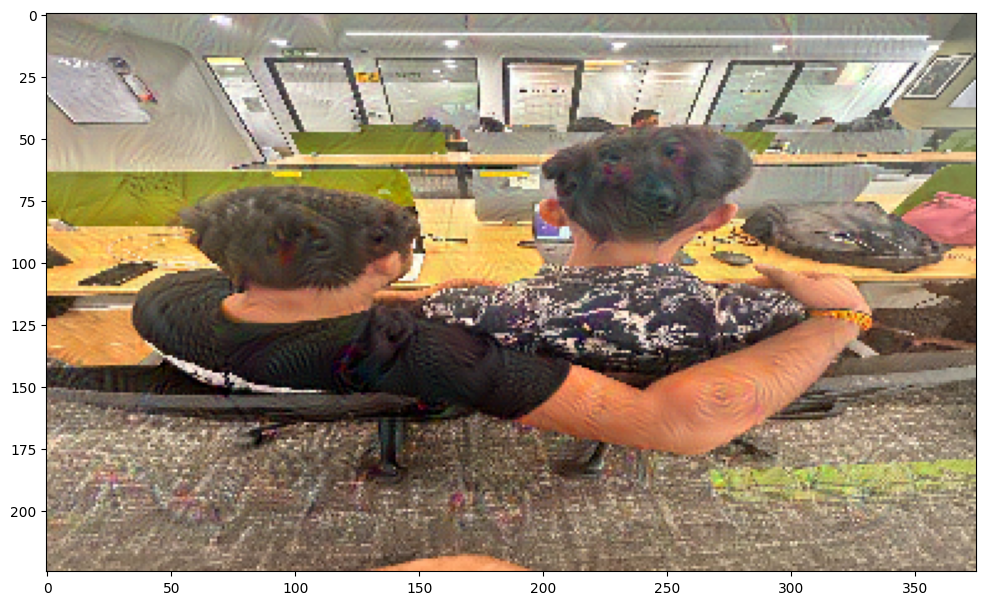

Epoch 1200, loss 1.5325078964233398


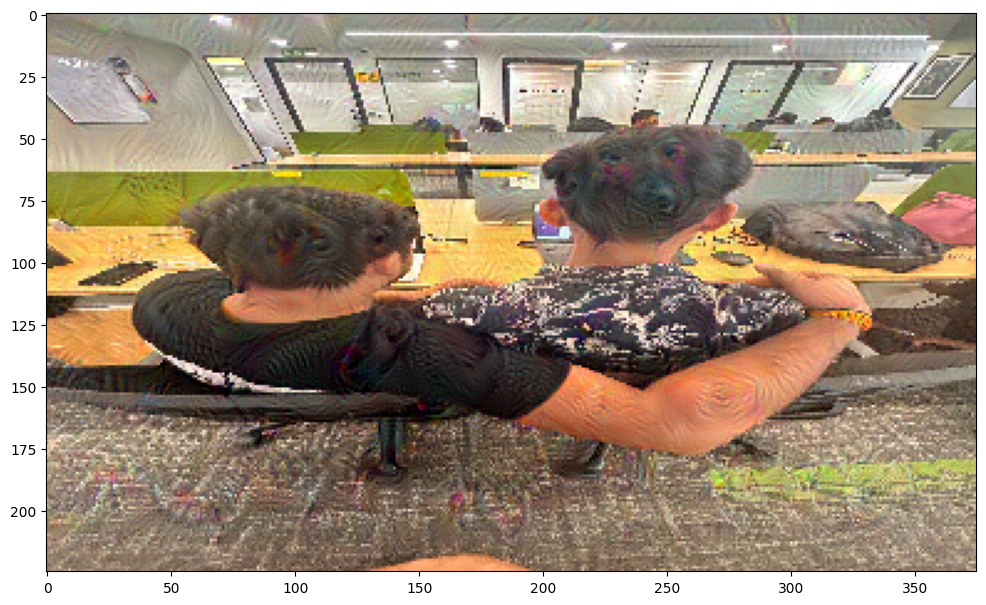

Epoch 1400, loss 1.5882112979888916


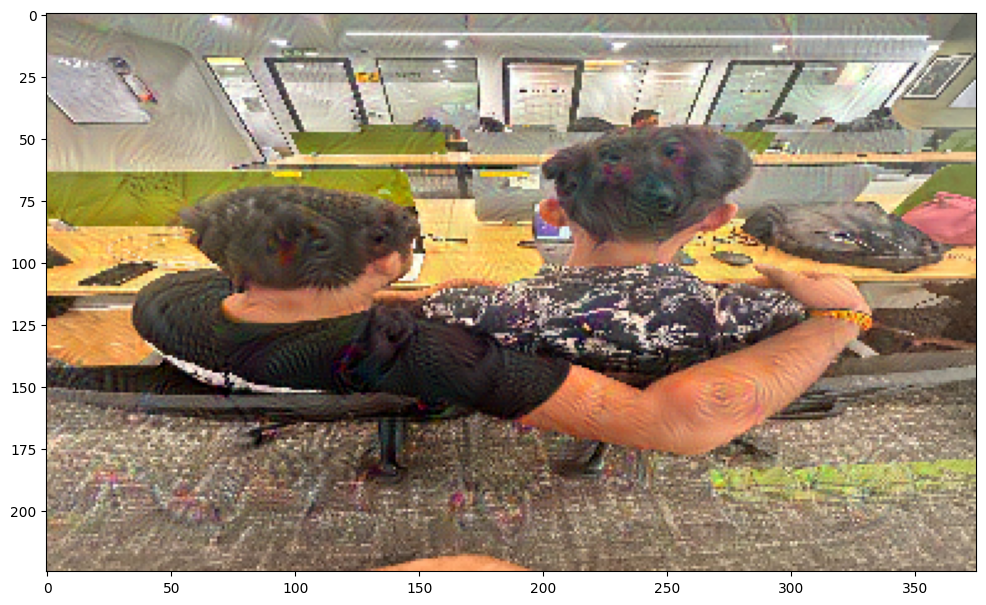

Epoch 1600, loss 1.6381573677062988


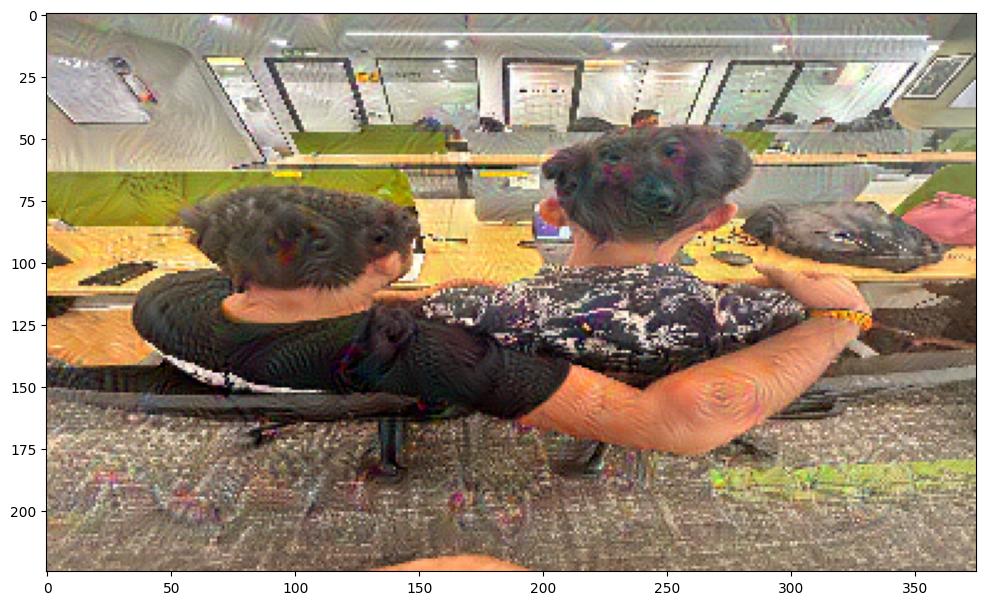

Epoch 1800, loss 1.683110237121582


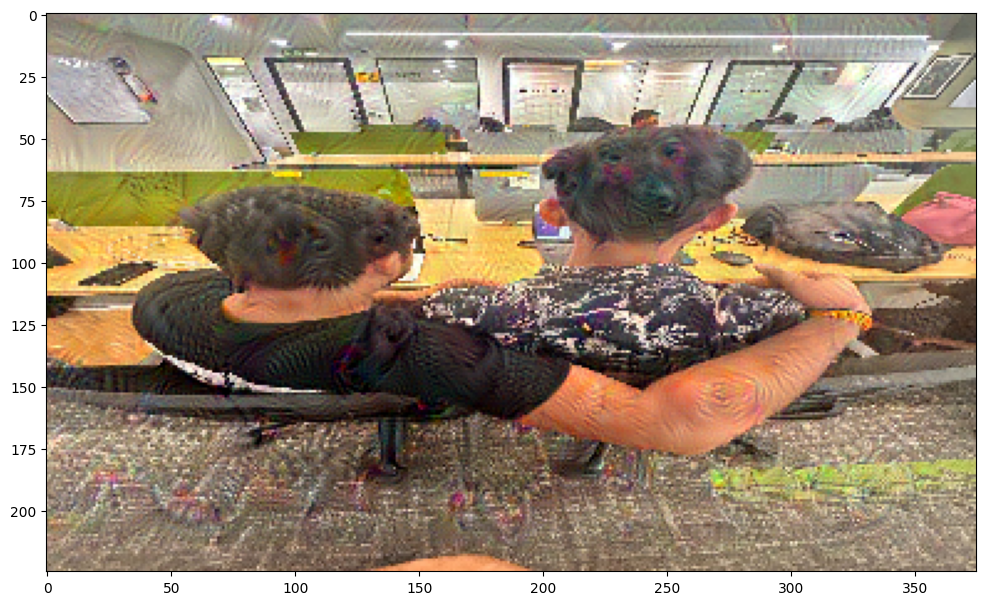

Epoch 2000, loss 1.7232156991958618


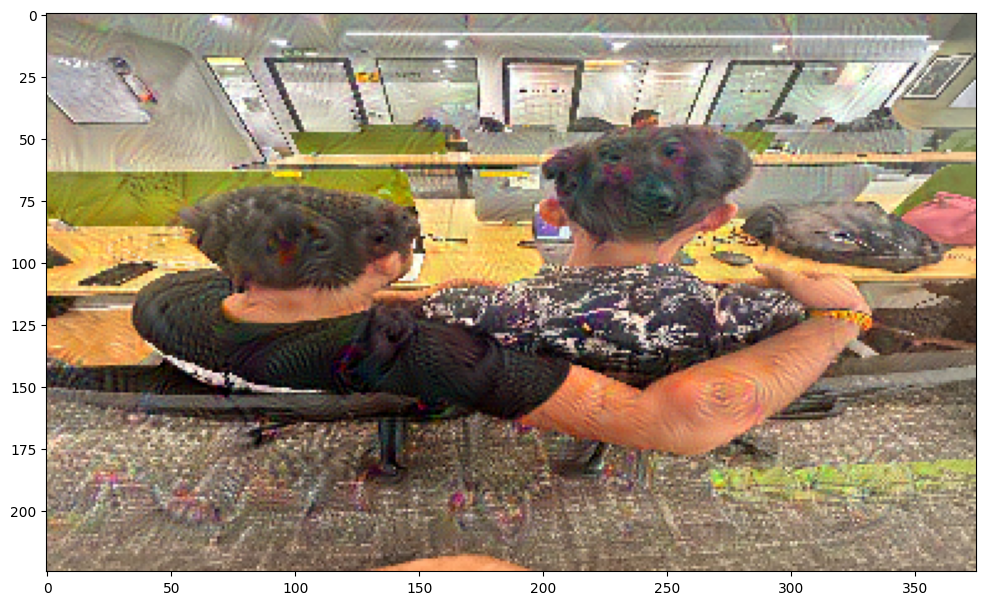

Epoch 2200, loss 1.7599200010299683


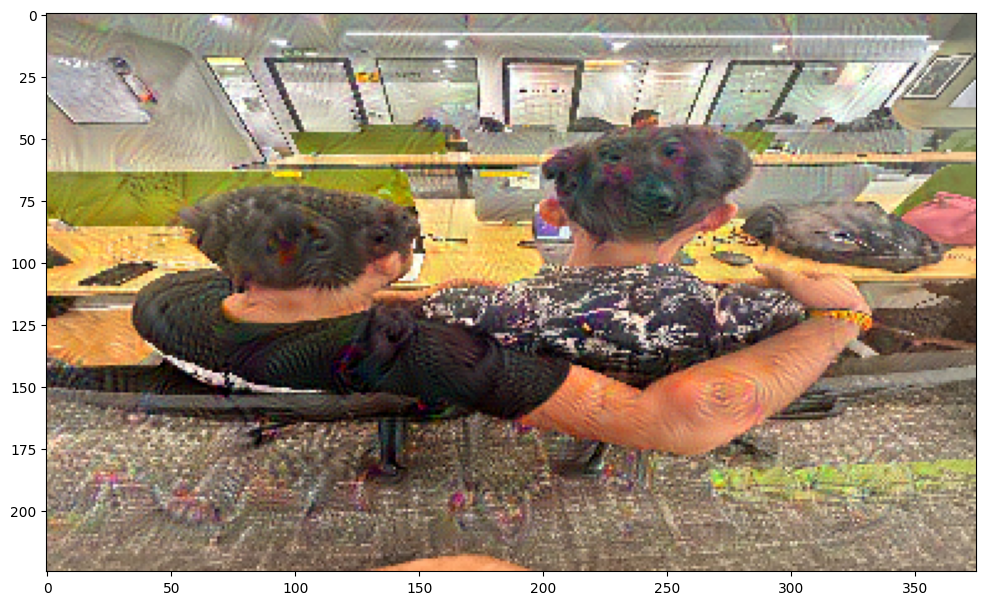

Epoch 2400, loss 1.7934885025024414


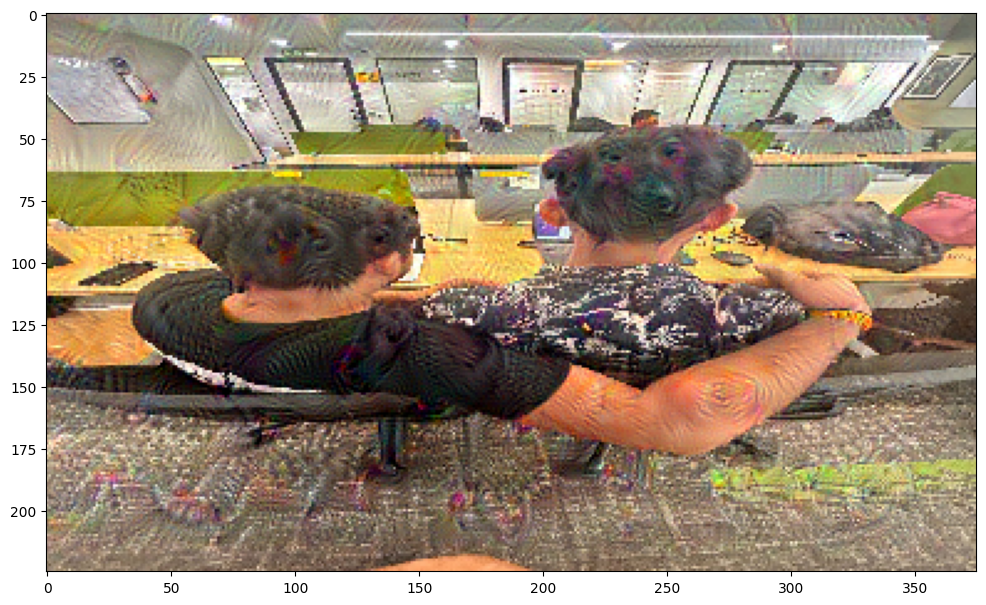

Epoch 2600, loss 1.8247644901275635


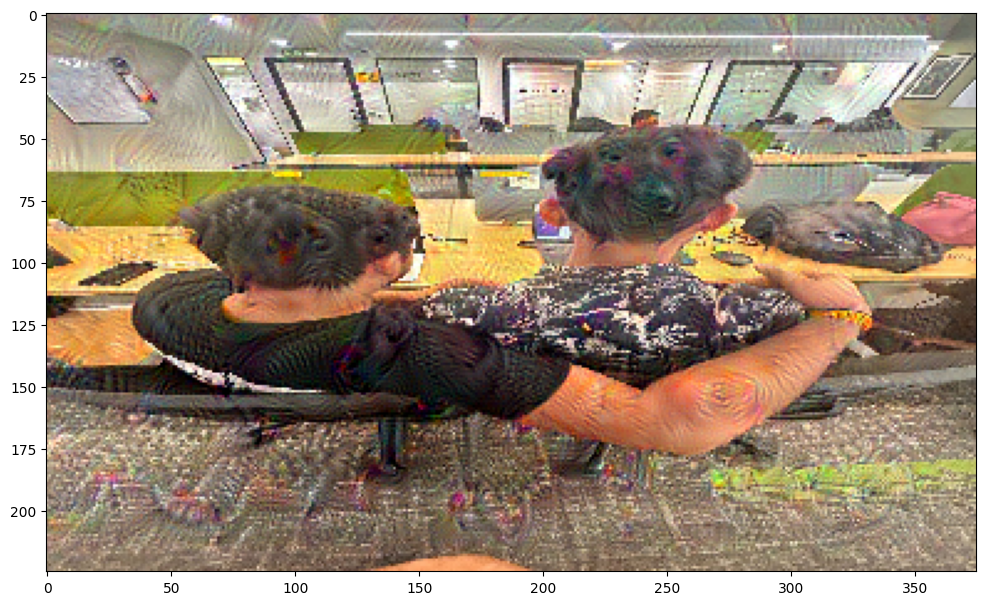

Epoch 2800, loss 1.854521632194519


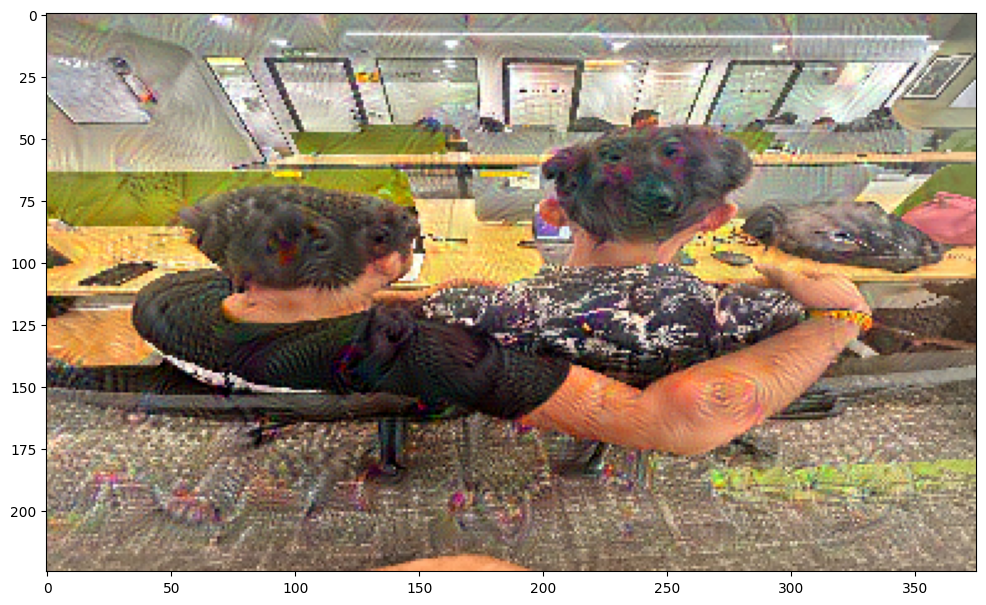

Epoch 3000, loss 1.8822743892669678


In [ ]:
run_deep_dream(network=deep_dream_model, image=image, epochs = 8000, learning_rate=0.0001)